# YOLO

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/YOLO_outputs/train

<IPython.core.display.Javascript object>

In [3]:
!pip install albumentations --quiet
from IPython.display import clear_output
clear_output()
print("Albumentations installed")

Albumentations installed


In [4]:
!pip install ultralytics
from IPython.display import clear_output
clear_output()
print("Ultralytics installed")

Ultralytics installed


In [ ]:
!apt-get install git-lfs -y
!git clone https://huggingface.co/StephanST/WALDO30

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git-lfs is already the newest version (3.0.2-1ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.
Cloning into 'WALDO30'...
remote: Enumerating objects: 54, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 54 (delta 23), reused 0 (delta 0), pack-reused 4 (from 1)
Unpacking objects: 100% (54/54), 1.77 MiB | 8.98 MiB/s, done.


In [ ]:
import albumentations as A
import cv2
import os
import shutil
from pathlib import Path

# Paths
image_dir = "/content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/train"
label_dir = "/content/drive/MyDrive/dataset/nvd/nvd_dataset_small/labels/train"
aug_image_dir = "/content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/train_snow"
aug_label_dir = "/content/drive/MyDrive/dataset/nvd/nvd_dataset_small/labels/train_snow"

os.makedirs(aug_image_dir, exist_ok=True)
os.makedirs(aug_label_dir, exist_ok=True)

# Define the snow transform
snow_aug = A.Compose(
    [A.RandomSnow(brightness_coeff=2.5, snow_point_lower=0.8, snow_point_upper=1.0, p=1)],
)


#A.Compose([
#    A.RandomSnow(snow_point_lower=0.8, snow_point_upper=1.0, brightness_coeff=2.5, p=1.0),
#    A.MotionBlur(blur_limit=5, p=0.3),
#    A.RandomFog(fog_coef_lower=0.3, fog_coef_upper=0.6, alpha_coef=0.2, p=0.5)
#])

# Loop through training images and apply snow
for img_file in os.listdir(image_dir):
    if not img_file.endswith((".jpg", ".png")):
        continue
    img_path = os.path.join(image_dir, img_file)
    img = cv2.imread(img_path)

    # Apply snow
    transformed = snow_aug(image=img)['image']

    # Save new image
    new_img_path = os.path.join(aug_image_dir, "snow_" + img_file)
    cv2.imwrite(new_img_path, transformed)

    # Copy corresponding label file
    label_file = img_file.replace(".jpg", ".txt").replace(".png", ".txt")
    src_label_path = os.path.join(label_dir, label_file)
    dst_label_path = os.path.join(aug_label_dir, "snow_" + label_file)
    if os.path.exists(src_label_path):
        shutil.copy(src_label_path, dst_label_path)

<ipython-input-6-b910cb5e806a>:18: UserWarning: Argument(s) 'snow_point_lower, snow_point_upper' are not valid for transform RandomSnow
  [A.RandomSnow(brightness_coeff=2.5, snow_point_lower=0.8, snow_point_upper=1.0, p=1)],


KeyboardInterrupt: 

In [ ]:
dataset_yaml = """
path: /content/drive/MyDrive/dataset/nvd/nvd_dataset_small
train: images/train
val: images/val
test: images/test_cycleGAN_30ep

nc: 1
names: ['car']
"""

with open("nvd_dataset_small.yaml", "w") as f:
    f.write(dataset_yaml)

In [ ]:
dataset_yaml = """
path: /content/drive/MyDrive/dataset/nvd/nvd_dataset_small
train:
    - images/train
    - images/train_cycleGAN
val: images/val
test: images/test

nc: 1
names: ['car']
"""

with open("nvd_dataset_small.yaml", "w") as f:
    f.write(dataset_yaml)

In [ ]:
dataset_yaml = """
path: /content/drive/MyDrive/dataset/nvd/nvd_dataset_small
train:
    - images/train
    - images/train_snow
    - images/train_cycleGAN
val: images/val
test: images/test

nc: 1
names: ['car']
"""

with open("nvd_dataset_small.yaml", "w") as f:
    f.write(dataset_yaml)

In [ ]:
from ultralytics import YOLO
from pathlib import Path

# Byt namn på name(gör så att loggning blir någorlunda korrekt formaterad) och välj en yolo genom att avkommentera. Går även att lägga till fler.
#model = YOLO("yolov8n.pt")
#model = YOLO("yolov9t.pt")
#model = YOLO("yolov10n.pt")
#model = YOLO("yolo11n.pt")
model = YOLO("yolo12n.pt")
#model = YOLO("yolo12m.pt")
#model = YOLO("/content/WALDO30/WALDO30_yolov8n_640x640.pt")
name = "car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz"

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.34M/5.34M [00:00<00:00, 63.3MB/s]


In [ ]:
# Train (Without augmentation)
model.train(
    data="nvd_dataset_small.yaml",
    epochs=30,
    imgsz=1024,
    batch=16,
    name=name,
    project="/content/drive/MyDrive/YOLO_outputs/train",
    # Parameters
    lr0 = 0.01,  # initial learning rate (SGD=1E-2, Adam=1E-3)
    lrf = 0.1,  # final OneCycleLR learning rate (lr0 * lrf)
    momentum = 0.937,  # SGD momentum/Adam beta1
    weight_decay = 0.0005,  # optimizer weight decay 5e-4
    warmup_epochs = 3.0,  # warmup epochs (fractions ok)
    warmup_momentum = 0.8,  # warmup initial momentum
    warmup_bias_lr = 0.1,  # warmup initial bias lr
    box = 0.05,  # box loss gain
    cls = 0.3,  # cls loss gain
    #cls_pw = 1.0,  # cls BCELoss positive_weight
    #obj = 0.7,  # obj loss gain (scale with pixels)
    #obj_pw = 1.0,  # obj BCELoss positive_weight
    #iou_t = 0.20,  # IoU training threshold
    #anchor_t = 4.0,  # anchor-multiple threshold
    #anchors: 3  # anchors per output layer (0 to ignore)
    #fl_gamma = 0.0,  # focal loss gamma (efficientDet default gamma=1.5)
    hsv_h = 0.0,  # image HSV-Hue augmentation (fraction)
    hsv_s = 0.0,  # image HSV-Saturation augmentation (fraction)
    hsv_v = 0.0,  # image HSV-Value augmentation (fraction)
    degrees = 0.0,  # image rotation (+/- deg)
    translate = 0.0,  # image translation (+/- fraction)
    scale = 0.0,  # image scale (+/- gain)
    shear = 0.0,  # image shear (+/- deg)
    perspective = 0.0,  # image perspective (+/- fraction), range 0-0.001
    flipud = 0.0,  # image flip up-down (probability)
    fliplr = 0.0,  # image flip left-right (probability)
    mosaic = 0.0,  # image mosaic (probability)
    mixup = 0.0,  # image mixup (probability)
    copy_paste = 0.0,  # segment copy-paste (probability)
)

Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: task=detect, mode=train, model=yolo12n.pt, data=nvd_dataset_small.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=1024, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/YOLO_outputs/train, name=car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

100%|██████████| 755k/755k [00:00<00:00, 13.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 64.8MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/labels/train.cache... 435 images, 0 backgrounds, 0 corrupt: 100%|██████████| 435/435 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/labels/val.cache... 290 images, 0 backgrounds, 0 corrupt: 100%|██████████| 290/290 [00:00<?, ?it/s]


Plotting labels to /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 8 dataloader workers
Logging results to /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      12.1G    0.01349      3.172      1.147         19       1024: 100%|██████████| 28/28 [00:08<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.12it/s]

                   all        290        961    0.00571      0.517    0.00439    0.00183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      12.1G    0.01034      1.792     0.9765          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.21it/s]

                   all        290        961    9.2e-05    0.00832   4.64e-05   1.33e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      12.1G   0.009014      1.357     0.9277          4       1024: 100%|██████████| 28/28 [00:06<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.10it/s]

                   all        290        961    0.00831      0.752      0.212     0.0967



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      12.1G   0.008721      1.201     0.9148          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.74it/s]

                   all        290        961      0.893       0.27      0.536      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      12.1G   0.008065     0.9358     0.8926          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.03it/s]

                   all        290        961      0.823      0.422      0.534      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      12.1G   0.007933     0.8034     0.8837          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.89it/s]

                   all        290        961      0.798      0.692      0.772      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      12.1G   0.007518      0.696     0.8696          8       1024: 100%|██████████| 28/28 [00:05<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.07it/s]

                   all        290        961      0.734      0.726      0.763      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      12.2G   0.006988     0.5965     0.8557          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.54it/s]

                   all        290        961      0.853      0.735      0.819      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      12.2G   0.006375     0.5142     0.8382         15       1024: 100%|██████████| 28/28 [00:06<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.48it/s]

                   all        290        961      0.882      0.754      0.847      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      12.2G   0.006196      0.488      0.833          8       1024: 100%|██████████| 28/28 [00:06<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.70it/s]

                   all        290        961      0.826      0.763      0.827      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      12.2G   0.005911     0.4414     0.8287          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.64it/s]

                   all        290        961      0.862      0.742      0.821      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      12.2G   0.006028     0.4419     0.8247         15       1024: 100%|██████████| 28/28 [00:06<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.11it/s]

                   all        290        961      0.868      0.759      0.845      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      12.2G   0.005709     0.3851      0.811          8       1024: 100%|██████████| 28/28 [00:06<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.75it/s]

                   all        290        961      0.874      0.787      0.849       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      12.2G   0.005584     0.3607     0.8072         12       1024: 100%|██████████| 28/28 [00:06<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.08it/s]

                   all        290        961      0.898       0.74      0.835      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      12.2G   0.005066      0.342     0.8026          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.51it/s]

                   all        290        961      0.892      0.799      0.876      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      12.2G    0.00474     0.3164     0.7947          8       1024: 100%|██████████| 28/28 [00:06<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.18it/s]

                   all        290        961      0.852      0.793      0.842       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      12.2G   0.004669     0.3045     0.7929          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.62it/s]

                   all        290        961      0.857      0.787      0.862      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      12.2G   0.004699     0.2991     0.7948          9       1024: 100%|██████████| 28/28 [00:06<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.82it/s]

                   all        290        961       0.91      0.786      0.861      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      12.2G   0.004584     0.2927     0.7885          8       1024: 100%|██████████| 28/28 [00:06<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.34it/s]

                   all        290        961      0.884      0.817      0.871       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      12.2G   0.004524     0.3113     0.7937         10       1024: 100%|██████████| 28/28 [00:06<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.96it/s]

                   all        290        961      0.886      0.804      0.881      0.609


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      12.2G   0.004277     0.2832     0.7854          6       1024: 100%|██████████| 28/28 [00:08<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.88it/s]

                   all        290        961      0.879      0.766      0.843      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      12.2G   0.004015     0.2628     0.7768          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.13it/s]

                   all        290        961      0.885      0.832      0.884      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      12.2G   0.003772     0.2441     0.7745         14       1024: 100%|██████████| 28/28 [00:06<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.84it/s]

                   all        290        961      0.936      0.801      0.889      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      12.2G    0.00354     0.2348     0.7718          9       1024: 100%|██████████| 28/28 [00:06<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.58it/s]

                   all        290        961      0.901      0.811      0.877      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      12.2G    0.00383     0.2443     0.7819          6       1024: 100%|██████████| 28/28 [00:06<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.44it/s]

                   all        290        961      0.893      0.808      0.866      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      12.2G   0.003547     0.2261     0.7708          9       1024: 100%|██████████| 28/28 [00:06<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.77it/s]

                   all        290        961      0.902      0.819      0.887       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      12.2G   0.003631      0.231     0.7736          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.50it/s]

                   all        290        961       0.91      0.806      0.888      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      12.2G   0.003263     0.2124     0.7661          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.11it/s]

                   all        290        961      0.909       0.81      0.885      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      12.2G   0.003008     0.2068     0.7651         18       1024: 100%|██████████| 28/28 [00:06<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.63it/s]

                   all        290        961      0.912      0.829      0.895      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      12.2G   0.002976     0.2064     0.7675          7       1024: 100%|██████████| 28/28 [00:06<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  6.08it/s]

                   all        290        961      0.933      0.816      0.901      0.641



30 epochs completed in 0.080 hours.
Optimizer stripped from /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3/weights/last.pt, 5.5MB
Optimizer stripped from /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3/weights/best.pt, 5.5MB

Validating /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3/weights/best.pt...
Ultralytics 8.3.108 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.60it/s]


                   all        290        961      0.933      0.816        0.9      0.641
Speed: 0.2ms preprocess, 1.4ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /content/drive/MyDrive/YOLO_outputs/train/car_detector_small_11n_nosnow_nocycleGAN_noaug_1024sz3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bc039e45350>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
test_images_path = "/content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test"
output_dir = f"/content/drive/MyDrive/YOLO_outputs/test/{name}"
results = model.predict(
    source=test_images_path,
    imgsz=640,
    save=True,
    save_txt=True,
    save_conf=True,
    conf=0.65,
    project=output_dir,
    name="test_predictions"
)


image 1/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000009.png: 384x640 (no detections), 81.4ms
image 2/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000019.png: 384x640 (no detections), 25.6ms
image 3/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000028.png: 384x640 (no detections), 17.3ms
image 4/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000031.png: 384x640 (no detections), 16.3ms
image 5/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000038.png: 384x640 (no detections), 17.0ms
image 6/119 /content/drive/MyDrive/dataset/nvd/nvd_dataset_small/images/test/2022-12-23 Bjenberg 02_stabilized-frame000042.png: 384x640 (no detections), 17.0ms
image 7/119 /content/drive/MyDrive/data

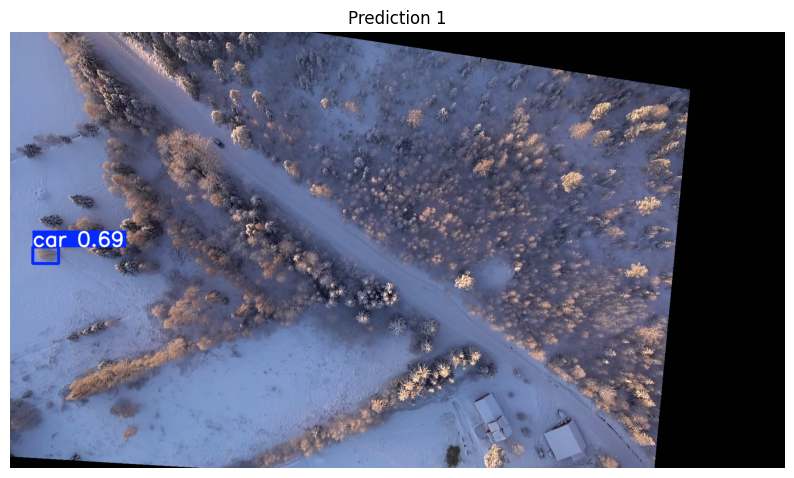

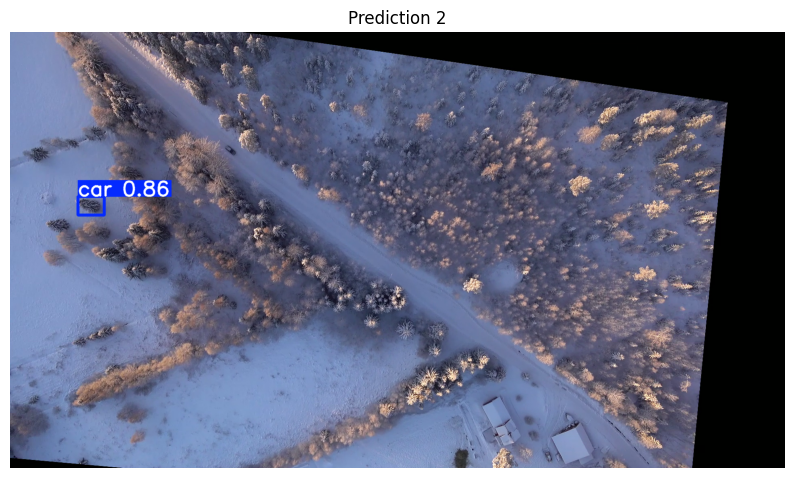

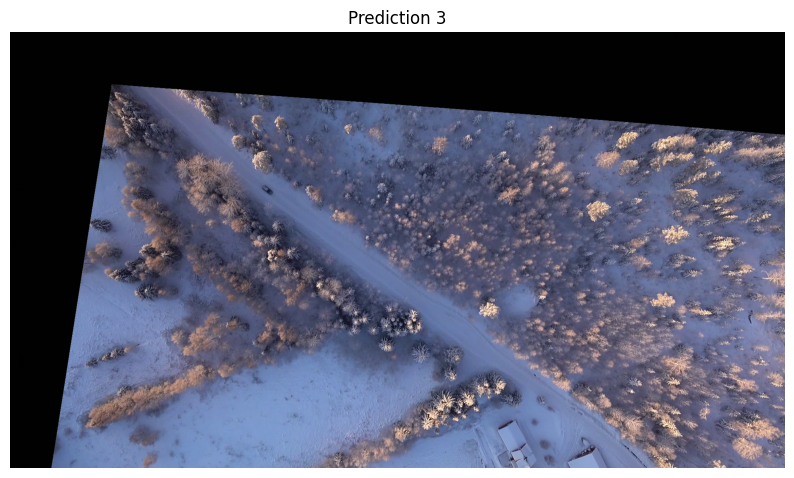

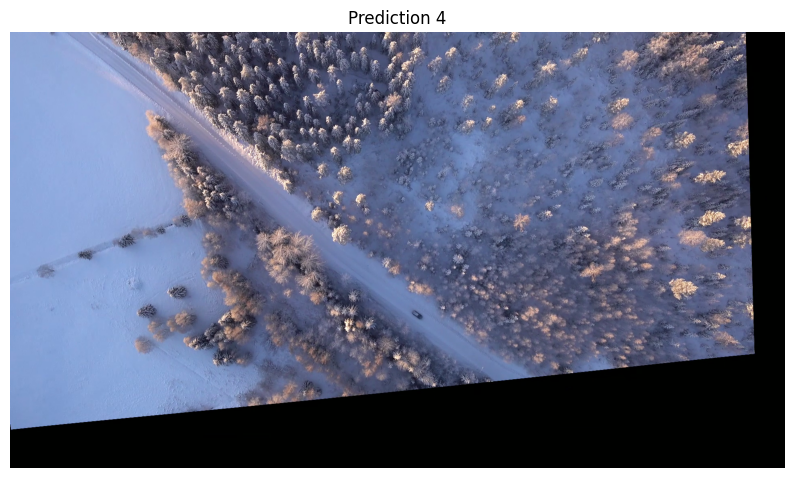

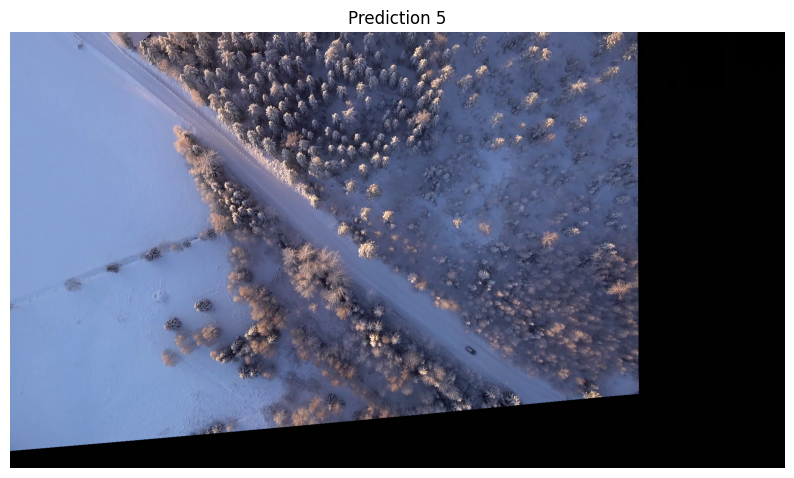

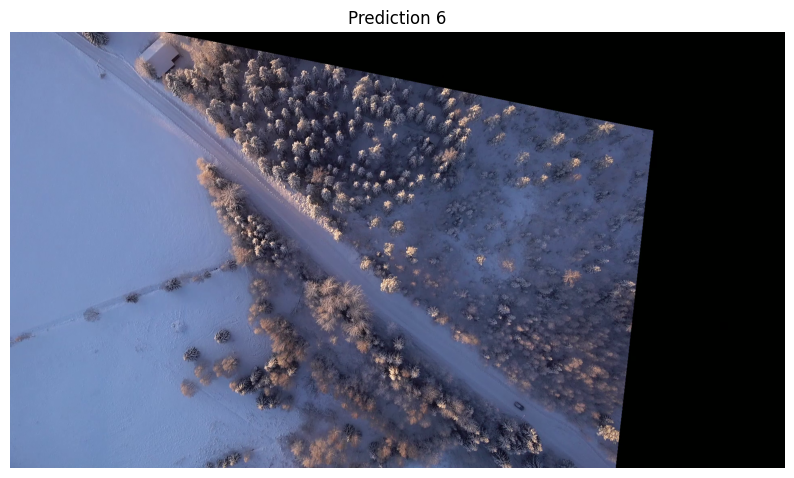

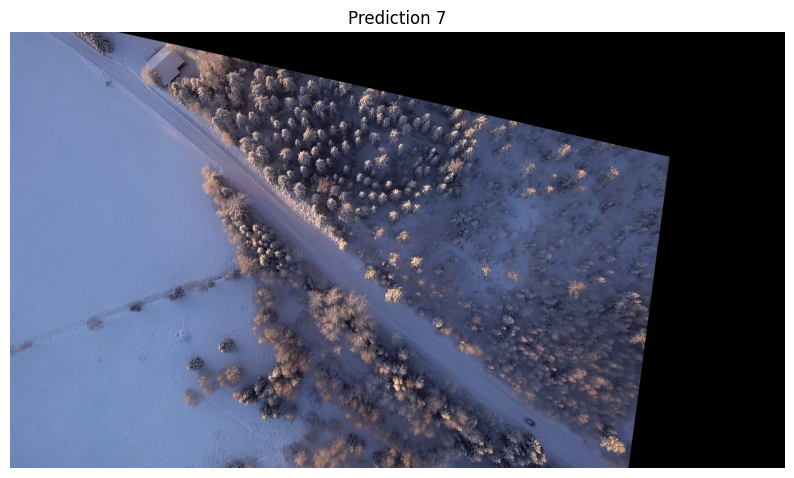

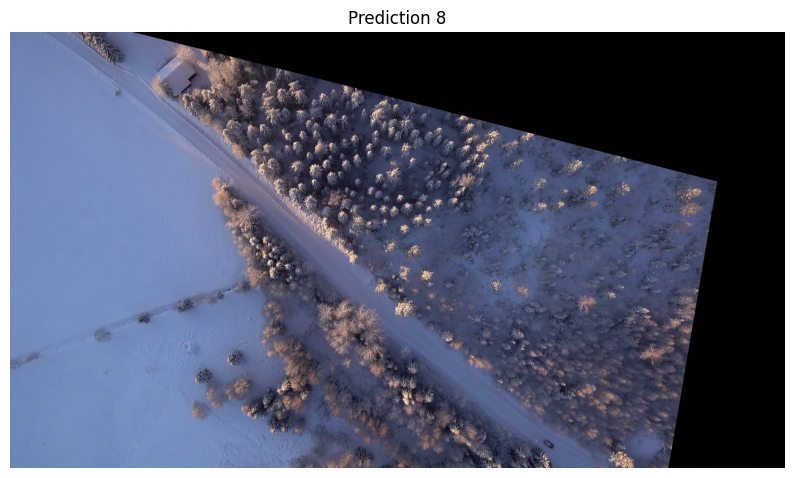

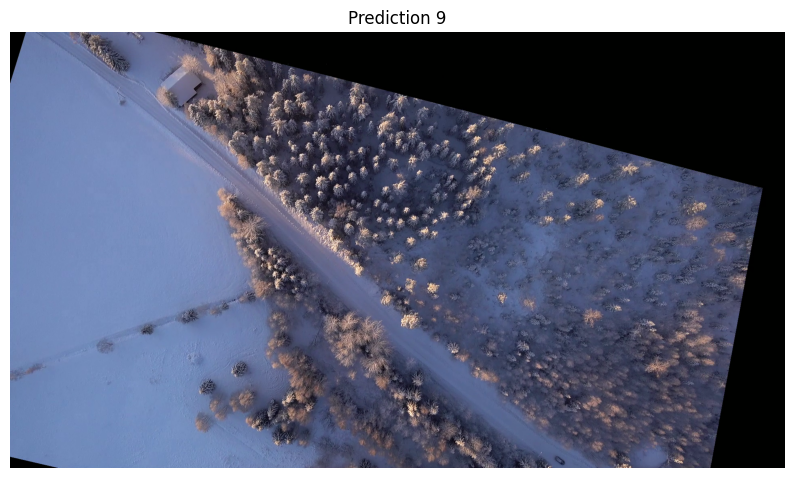

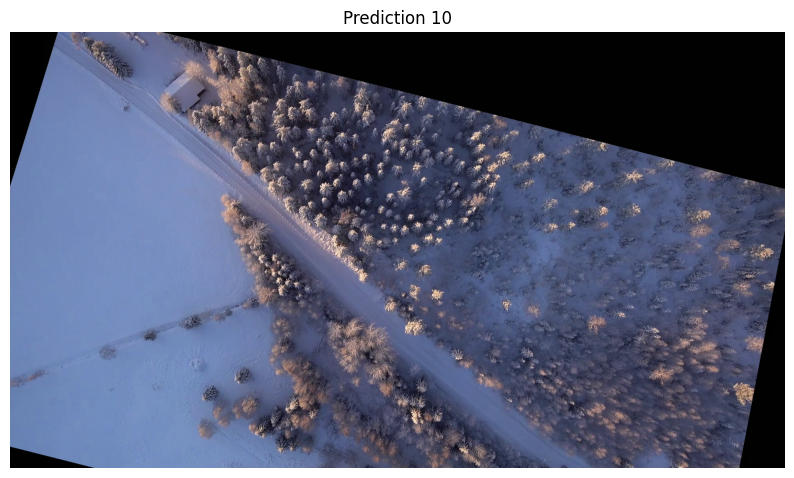

In [ ]:
import cv2
import matplotlib.pyplot as plt


# Plot fungerar tydligen inte(Man kan hitta bilderna med detections i run/test)

for i, result in enumerate(results[12:22]):
    img_with_boxes = result.plot()

    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
    plt.title(f"Prediction {i+1}")
    plt.axis('off')
    plt.show()

    #save_path = Path(output_dir) / "test_predictions" / f"pred_{i+1}.jpg"
    #cv2.imwrite(str(save_path), img_with_boxes)
